In [1]:
from torchvision.utils import save_image
from torchvision import transforms
import os
from PIL import Image
import torch
import matplotlib.pyplot as plt
from src.generator import Generator

C:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\utils\_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(


## Transform 

In [2]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5] * 3, std=[0.5] * 3)
])

denorm = transforms.Compose([
    transforms.Normalize(mean=[0., 0., 0.], std=[1 / 0.5] * 3),
    transforms.Normalize(mean=[-0.5] * 3, std=[1.] * 3),
])


## Necessary func

In [3]:
def generate_and_save(generator, input_path, output_path, device="cpu"):
    img = Image.open(input_path).convert("RGB")
    x = transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        y = generator(x)

    y = denorm(y.squeeze(0).cpu())
    save_image(y, output_path)
    print(f"Saved generated image to {output_path}")


def generate_from_folder(generator, input_dir, output_dir, device="cpu", max_images=10):
    os.makedirs(output_dir, exist_ok=True)
    image_paths = [os.path.join(input_dir, f) for f in os.listdir(input_dir) if
                   f.endswith(".jpg") or f.endswith(".png")]

    for i, img_path in enumerate(image_paths[:max_images]):
        filename = os.path.basename(img_path)
        output_path = os.path.join(output_dir, f"{filename}")
        generate_and_save(generator, img_path, output_path, device=device)


def show_comparisons_from_folders(input_dir, output_dir, title):
    input_files = sorted(os.listdir(input_dir))
    output_files = sorted(os.listdir(output_dir))
    common_files = set(input_files) & set(output_files)

    common_files = sorted(common_files)
    for i in range(0, len(common_files), 5):
        batch_files = common_files[i:i + 5]
        fig, axes = plt.subplots(nrows=2, ncols=len(batch_files), figsize=(15, 6))

        for j, filename in enumerate(batch_files):
            input_path = os.path.join(input_dir, filename)
            output_path = os.path.join(output_dir, filename)

            input_img = Image.open(input_path).convert("RGB")
            output_img = Image.open(output_path).convert("RGB")

            axes[0, j].imshow(input_img)
            axes[0, j].set_title("Input")
            axes[0, j].axis("off")

            axes[1, j].imshow(output_img)
            axes[1, j].set_title("Generated")
            axes[1, j].axis("off")

        plt.suptitle(f"{title}", fontsize=16)
        plt.tight_layout()
        plt.subplots_adjust(top=0.9)
        plt.show()

## Visual Comparison

In [4]:
def load_model(path, config):
    generator = Generator(**config).create()
    state_dict = torch.load(path, map_location="cpu")

    if "state_dict" in state_dict:
        state_dict = state_dict["state_dict"]

    clean_state_dict = {}
    for k, v in state_dict.items():
        if k.startswith("G_PS."):
            new_k = k[len("G_PS."):]
            clean_state_dict[new_k] = v

    generator.load_state_dict(clean_state_dict)
    return generator

### Aivazovsky generators

In [ ]:
gen_config_resnet = {
    "name": "resnet",
    "num_resblocks": 9,
    "hidden_channels": 64,
}

gen_config_unet = {
    "name": "unet",
    "num_resblocks": 9,
    "hidden_channels": 64,
}

a_gen_unet = load_model("./checkpoints/aivazovsky unet/epoch-epoch=09.ckpt", gen_config_unet).eval() # best model based on loss
a_gen_resnet = load_model("./checkpoints/aivazovsky resnet/last.ckpt", gen_config_resnet).eval()

In [10]:
generate_from_folder(a_gen_unet, "test", "results/aivazovsky_unet/", device="cpu")

Saved generated image to results/aivazovsky_unet/1.jpg
Saved generated image to results/aivazovsky_unet/1398.jpg
Saved generated image to results/aivazovsky_unet/1471.jpg
Saved generated image to results/aivazovsky_unet/1513.jpg
Saved generated image to results/aivazovsky_unet/1791.jpg
Saved generated image to results/aivazovsky_unet/2.jpg
Saved generated image to results/aivazovsky_unet/3.jpg
Saved generated image to results/aivazovsky_unet/407.jpg
Saved generated image to results/aivazovsky_unet/485.jpg
Saved generated image to results/aivazovsky_unet/5.jpg


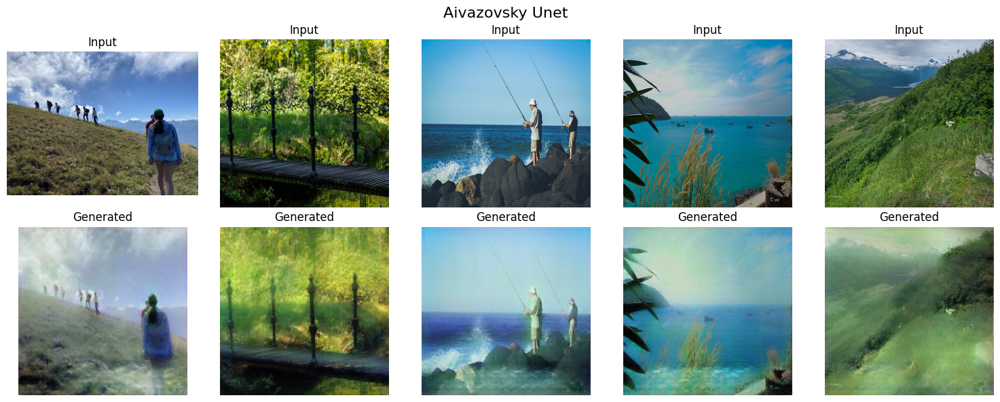

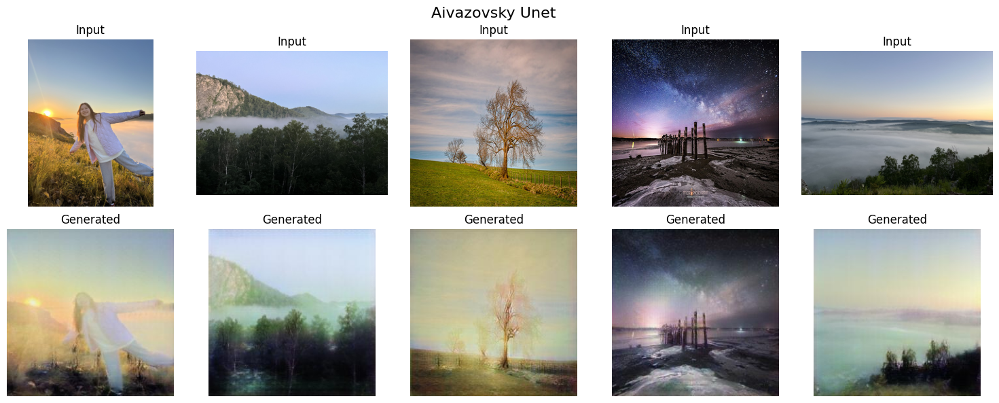

In [11]:
show_comparisons_from_folders("test", "results/aivazovsky_unet/", "Aivazovsky Unet")

Saved generated image to results/aivazovsky_resnet/1.jpg
Saved generated image to results/aivazovsky_resnet/1398.jpg
Saved generated image to results/aivazovsky_resnet/1471.jpg
Saved generated image to results/aivazovsky_resnet/1513.jpg
Saved generated image to results/aivazovsky_resnet/1791.jpg
Saved generated image to results/aivazovsky_resnet/2.jpg
Saved generated image to results/aivazovsky_resnet/3.jpg
Saved generated image to results/aivazovsky_resnet/407.jpg
Saved generated image to results/aivazovsky_resnet/485.jpg
Saved generated image to results/aivazovsky_resnet/5.jpg


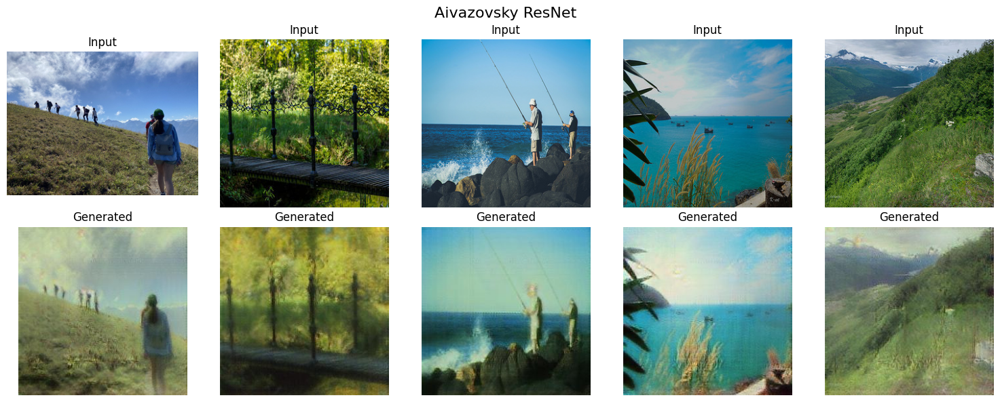

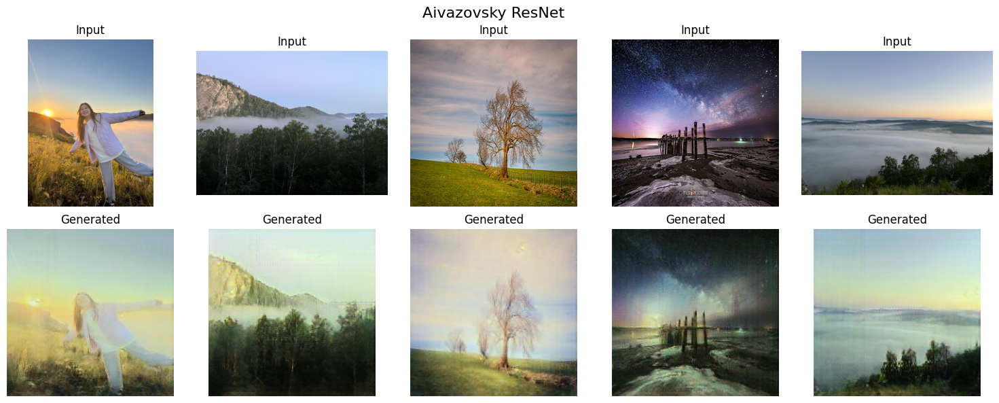

In [14]:
generate_from_folder(a_gen_resnet, "test", "results/aivazovsky_resnet/", device="cpu")
show_comparisons_from_folders("test", "results/aivazovsky_resnet/", "Aivazovsky ResNet")

### Ghibli generators

In [13]:
g_gen_unet = load_model("../checkpoints/ghibli unet/epoch-epoch=09.ckpt", gen_config_unet).eval() # best model based on loss
g_gen_resnet = load_model("../checkpoints/ghibli resnet/last.ckpt", gen_config_resnet).eval()

Saved generated image to results/ghibli_unet/1.jpg
Saved generated image to results/ghibli_unet/1398.jpg
Saved generated image to results/ghibli_unet/1471.jpg
Saved generated image to results/ghibli_unet/1513.jpg
Saved generated image to results/ghibli_unet/1791.jpg
Saved generated image to results/ghibli_unet/2.jpg
Saved generated image to results/ghibli_unet/3.jpg
Saved generated image to results/ghibli_unet/407.jpg
Saved generated image to results/ghibli_unet/485.jpg
Saved generated image to results/ghibli_unet/5.jpg


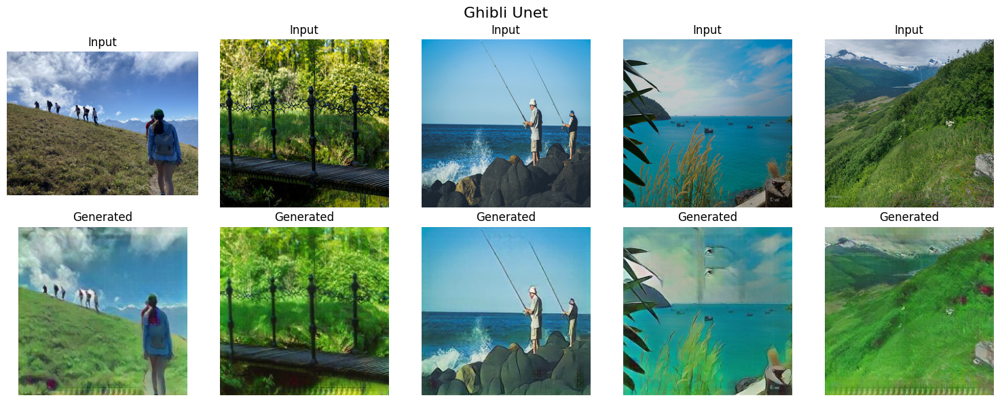

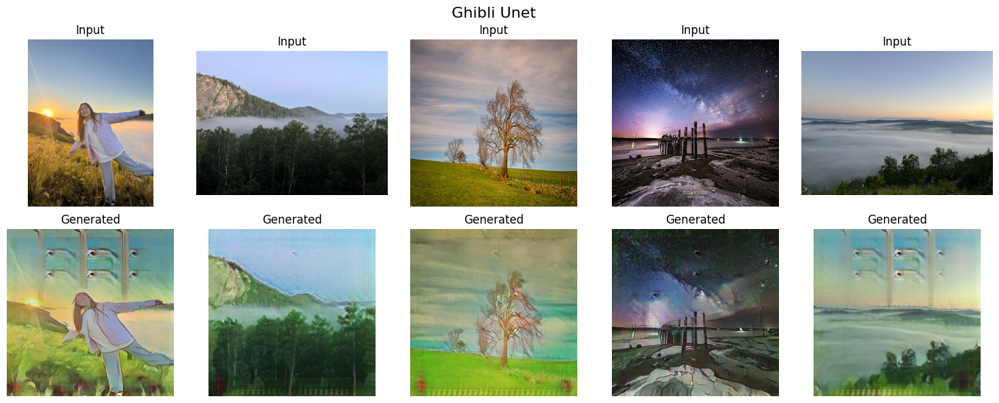

In [16]:
generate_from_folder(g_gen_unet, "test", "results/ghibli_unet/", device="cpu")
show_comparisons_from_folders("test", "results/ghibli_unet/", "Ghibli Unet")

Saved generated image to results/ghibli_resnet/1.jpg
Saved generated image to results/ghibli_resnet/1398.jpg
Saved generated image to results/ghibli_resnet/1471.jpg
Saved generated image to results/ghibli_resnet/1513.jpg
Saved generated image to results/ghibli_resnet/1791.jpg
Saved generated image to results/ghibli_resnet/2.jpg
Saved generated image to results/ghibli_resnet/3.jpg
Saved generated image to results/ghibli_resnet/407.jpg
Saved generated image to results/ghibli_resnet/485.jpg
Saved generated image to results/ghibli_resnet/5.jpg


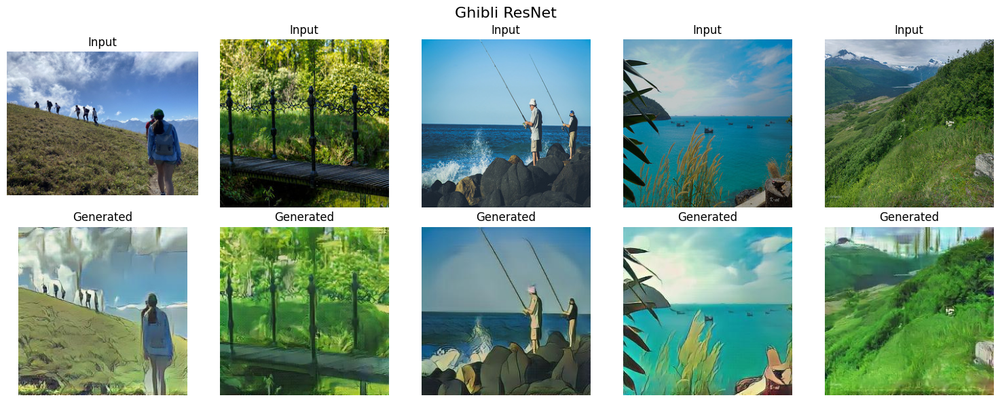

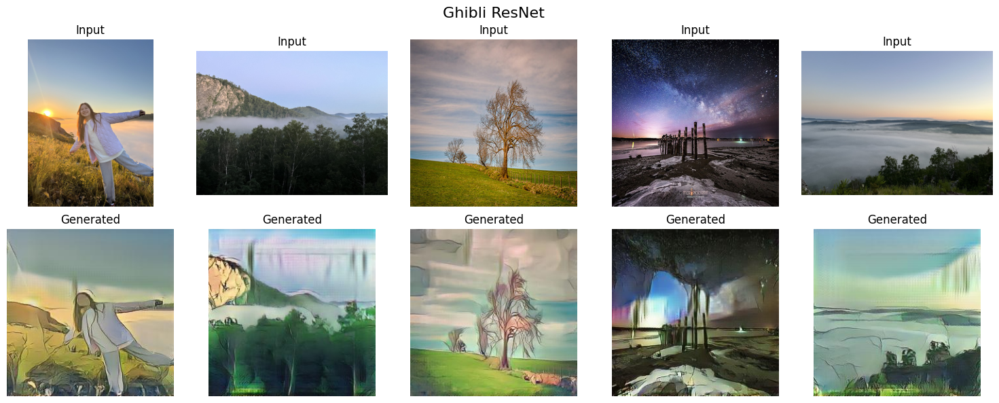

In [17]:
generate_from_folder(g_gen_resnet, "test", "results/ghibli_resnet/", device="cpu")
show_comparisons_from_folders("test", "results/ghibli_resnet/", "Ghibli ResNet")